In [2]:
import cv2
import PIL
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from random import sample
from matplotlib.pyplot import figure
%matplotlib inline

In [2]:
def plotRawImages(source, target):
    size, rows, cols = 64, 10, 10
    data = pd.read_csv('../../data/cdeotte/data.csv')
    data = data[(data['source'] == source) & (data['target'] == target)]
    data = sample(data['image_id'].tolist(), 100)
    path = '../../data/cdeotte/train/train/'
    data = [path + x + '.jpg' for x in data]
    mosaic = PIL.Image.new(mode='RGB', size=(size*cols + (cols-1), size*rows + (rows-1)))
    for idx, name in enumerate(data):
        img = cv2.imread(name, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ix  = idx % cols
        iy  = idx // cols
        img = np.clip(img, 0, 255).astype(np.uint8)
        img = PIL.Image.fromarray(img)
        img = img.resize((size, size), resample=PIL.Image.BILINEAR)
        mosaic.paste(img, (ix*size + ix, iy*size + iy))
    plt.figure(figsize=(12,12))
    plt.imshow(mosaic)
    return None

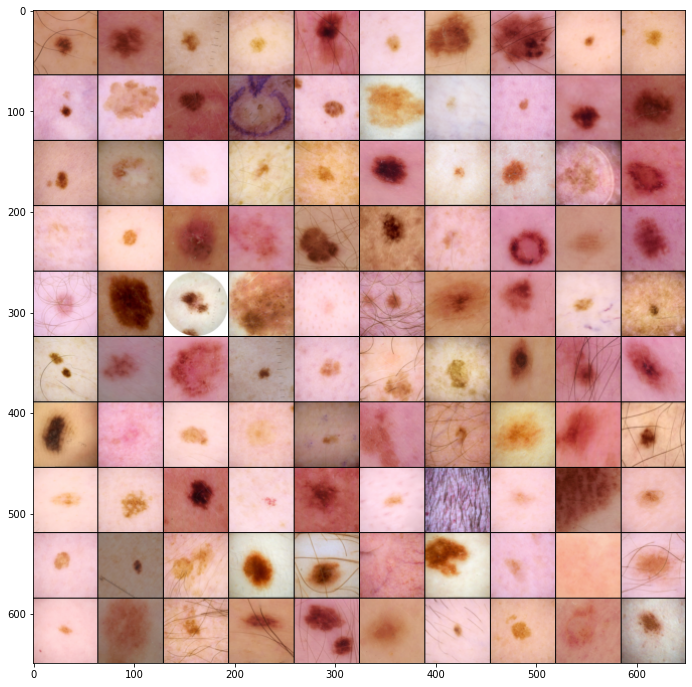

In [3]:
plotRawImages('ISIC20', 0)

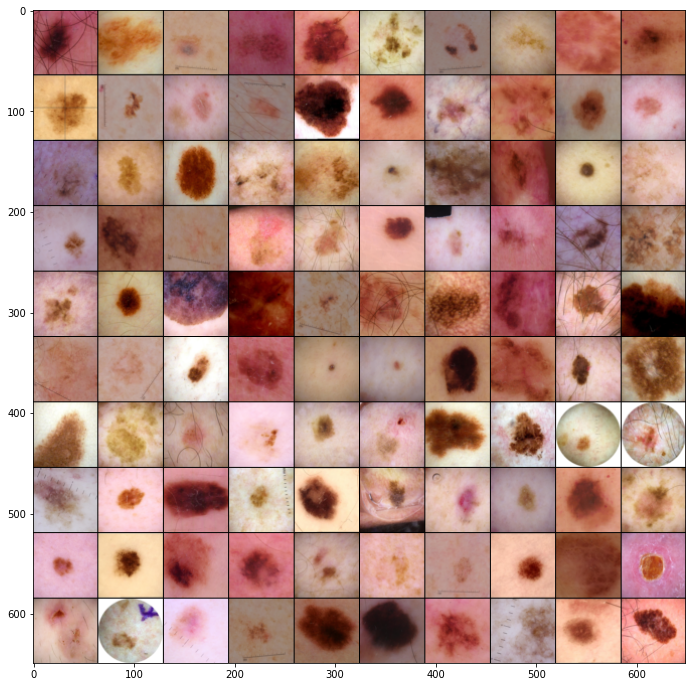

In [4]:
plotRawImages('ISIC20', 1)

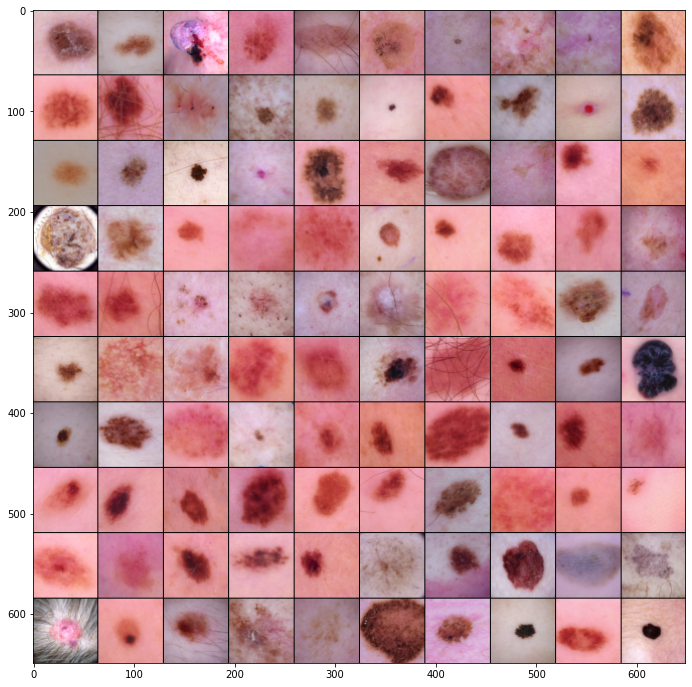

In [5]:
plotRawImages('HAM10000', 0)

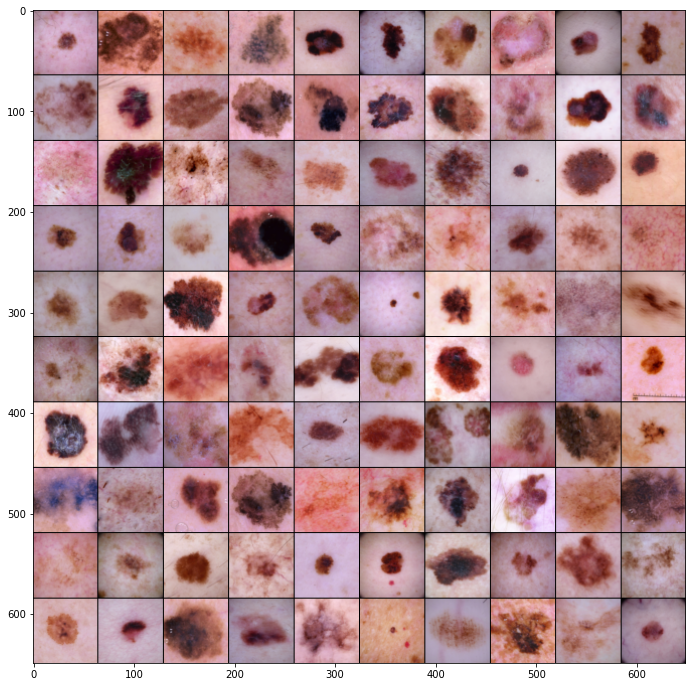

In [6]:
plotRawImages('HAM10000', 1)

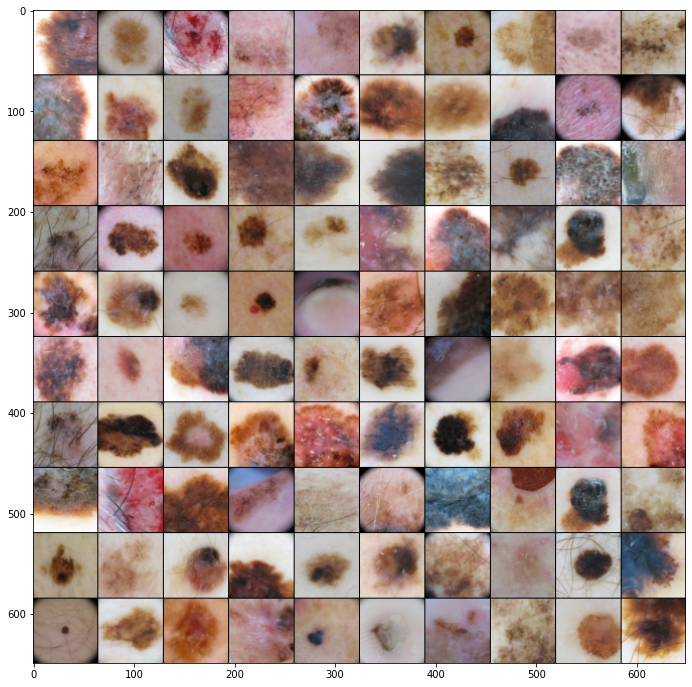

In [7]:
plotRawImages('ISIC19', 1)

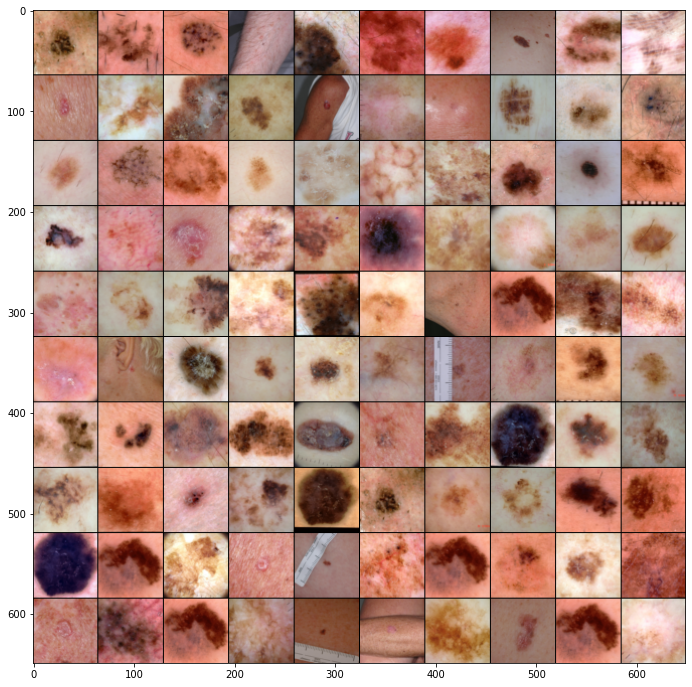

In [8]:
plotRawImages('EXTRA', 1)

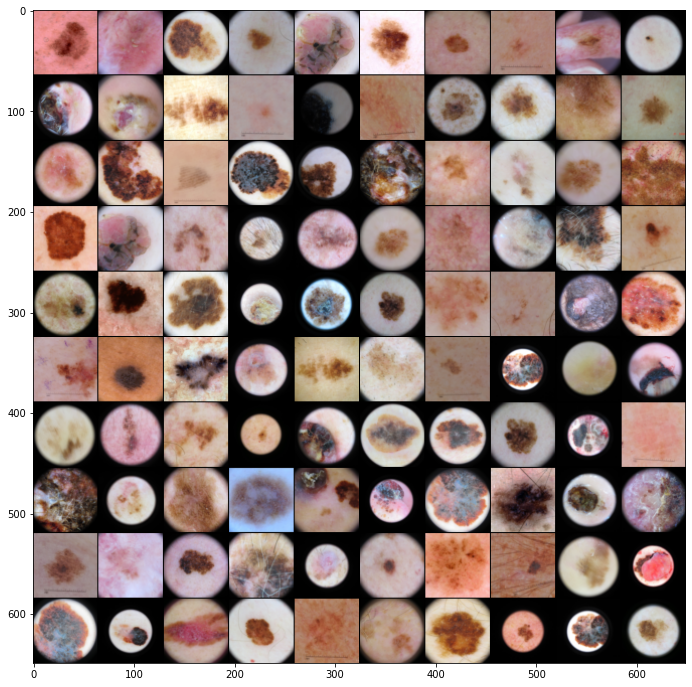

In [9]:
plotRawImages('IGNORE', 1)

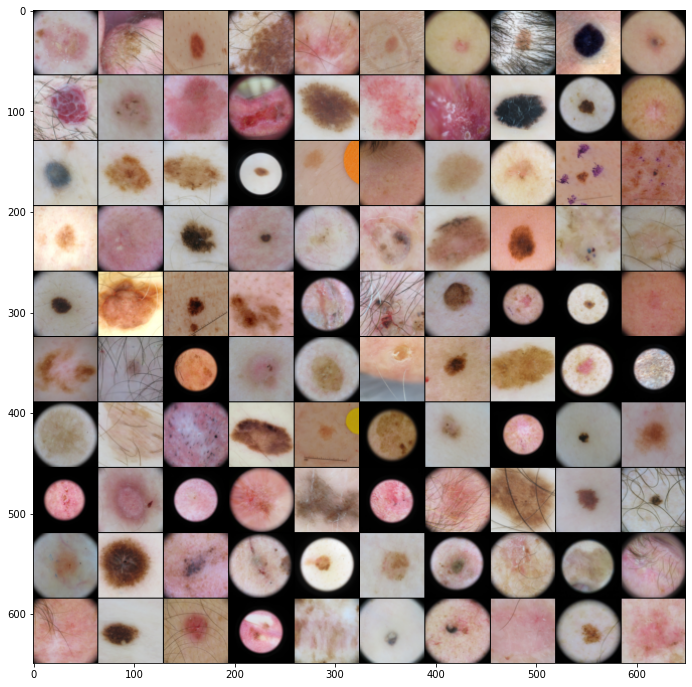

In [10]:
plotRawImages('IGNORE', 0)

In [12]:
def plotRawImages(target):
    size, rows, cols = 64, 10, 10
    data = pd.read_csv('../../data/pretrain/data.csv')
    data = data[(data['diagnosis'] == target)]
    data = sample(data['image_id'].tolist(), 100)
    path = '../../data/pretrain/images/'
    data = [path + x for x in data]
    mosaic = PIL.Image.new(mode='RGB', size=(size*cols + (cols-1), size*rows + (rows-1)))
    for idx, name in enumerate(data):
        img = cv2.imread(name, cv2.IMREAD_COLOR)
        ix  = idx % cols
        iy  = idx // cols
        img = np.clip(img, 0, 255).astype(np.uint8)
        img = PIL.Image.fromarray(img)
        img = img.resize((size, size), resample=PIL.Image.BILINEAR)
        mosaic.paste(img, (ix*size + ix, iy*size + iy))
    plt.figure(figsize=(12,12))
    plt.imshow(mosaic)
    return None

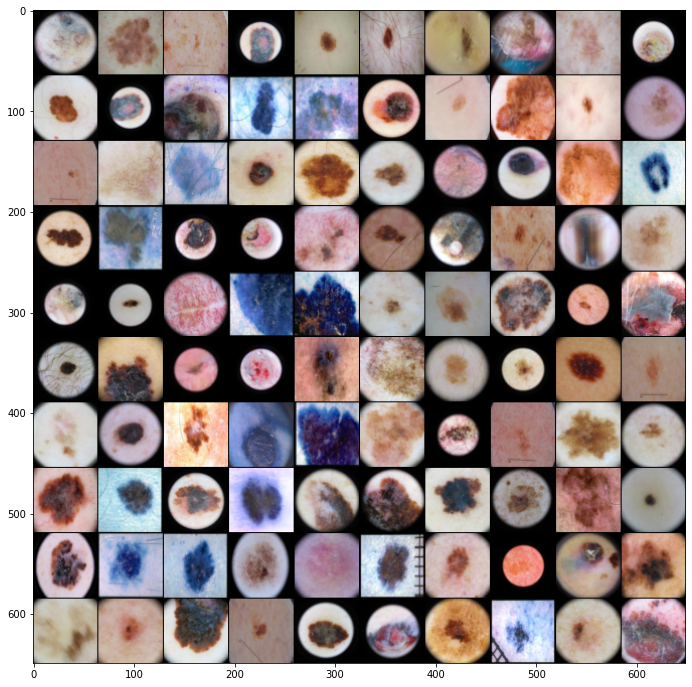

In [13]:
plotRawImages('melanoma')

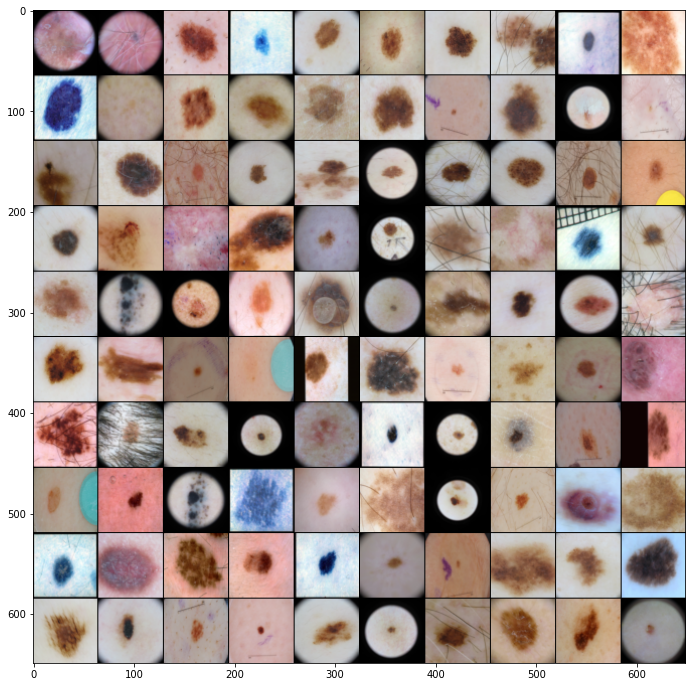

In [14]:
plotRawImages('nevus')

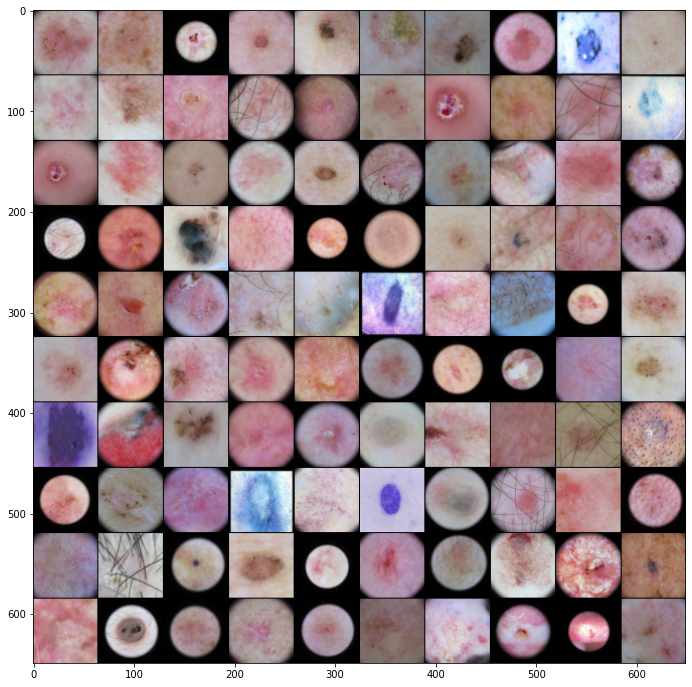

In [15]:
plotRawImages('other')

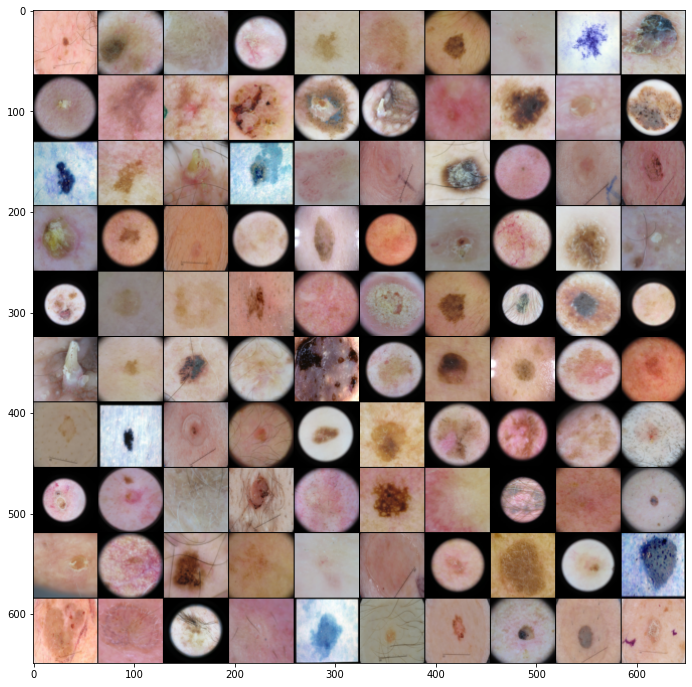

In [16]:
plotRawImages('keratosis')